<h1 align=center> <font size = 7> Investigation of Houston and New York Neighborhoods</font></h1>

# Section Title 
1. [Houston Data Scraping]()
2. [New York Data Scraping]()
3. [Super Category Define]()
4. [Houston Venue Clustering]()
5. [New York Venue CLustering]()

<h1 align=center> <font size = 5>                       Houston Data Scraping</font></h1>

## Table of Contents
1. <a href="#item1"> Scrape Data for Houston and creat a dataframe</a>

2. <a href="#item2"> Analyze Data for Houston </a>

<a id ="item1"></a>

## 1. Scrape Data for Houston and creat a dataframe

### Scrape Data from Wikipedia page

In [3]:
from bs4 import BeautifulSoup
from urllib.request import urlopen
import numpy as np
import pandas as pd
from geopy.geocoders import Nominatim

In [4]:
html = urlopen("https://en.wikipedia.org/wiki/List_of_Houston_neighborhoods").read()

In [5]:
soup = BeautifulSoup(html, features='lxml') ###read with lxml format
type(soup)

bs4.BeautifulSoup

In [6]:
table = soup.find('table','wikitable')

In [7]:
table1 = table.find_all('tr')[2].find_all('td')[1].get_text().replace('\n','')# use lxml read body of table
table1

'Greater Greenspoint'

### Read table infor into a list table_NB

In [8]:
table_NB = []
maxlen = len(table.find_all('tr'))
for i in range(1,maxlen):
        table_NB.append(table.find_all('tr')[i].find_all('td')[1].get_text().replace('\n',''))
[x.strip() for x in table_NB[3].split("/")]

['Fairbanks', 'Northwest Crossing']

In [9]:
for c in table_NB:
    if "/" in c:
        table_NB = table_NB + [x.strip() for x in c.split("/")]
        table_NB.remove(c)
    elif "(" in c:
        a,b = [x.strip() for x in c.split("(")]
        table_NB.append(a)
        table_NB.remove(c)
len(table_NB)

114

### find latitude and longtitude with geopy

In [10]:
address = 'Texas Medical Center, Houston,TX'

geolocator = Nominatim(user_agent="houston_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Houston are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Houston are 29.7027053, -95.3959485291151.


In [17]:
def find_latitude_longtitude(neighborhood_list):
    a = []
    b = []
    for i, c in enumerate(neighborhood_list):
        address = c + ", Houston,TX"
        geolocator = Nominatim(user_agent="houston_explorer")
        location = geolocator.geocode(address)
        if location is not None:
            a.append(location.latitude)
            b.append(location.longitude)
        else:
            a.append(None)
            b.append(None)
        
    return(a,b)

In [18]:
lat,long = find_latitude_longtitude(table_NB)

In [19]:
len(lat)

114

In [20]:
df = pd.DataFrame({"Neighbourhood":table_NB,"Latitude":lat,"Longitude":long})
df.head()

,Neighbourhood,Latitude,Longitude
0,Willowbrook,29.660254,-95.456096
1,Greater Greenspoint,29.944719,-95.416074
2,Carverdale,29.848687,-95.539450
3,Greater Inwood,NaN,NaN
4,Acres Home,29.770793,-95.328129


In [21]:
df.to_csv('houston_latitude_geopy_tmp.csv')

### some latitude and longitude are string and can not show, let change then to numeric values

In [22]:
df['Latitude'] = pd.to_numeric(df['Latitude'])
df['Longitude'] = pd.to_numeric(df['Longitude'])

In [23]:
df.head(2)

,Neighbourhood,Latitude,Longitude
0,Willowbrook,29.660254,-95.456096
1,Greater Greenspoint,29.944719,-95.416074


In [24]:
la_max = df['Latitude'].max()
la_min = df['Latitude'].min()

ll_min = df['Longitude'].min()
ll_max = df['Longitude'].max()
print('la_max,la_min,ll_max,ll_min',la_max,la_min,ll_max,ll_min)

la_max,la_min,ll_max,ll_min 39.489543 29.6048614 -80.6281232 -119.752991


### The value of latitude max is off; the value of longitude max is missing a '-' sign; the value of longitude min is off, let's save to a file and manually fix them

In [25]:
df.to_csv('houston_latitude_geopy_tmp2.csv')

### updated abnormal value by hand  and save as a new file, let's load it

In [30]:
df2 = pd.read_csv('houston_latitude_geopy.csv',usecols = [1,2,3])
df2.head(2)

,Neighbourhood,Latitude,Longitude
0,Willowbrook,29.660254,-95.456096
1,Greater Greenspoint,29.944719,-95.416074


In [31]:
la_max = df2['Latitude'].max()
la_min = df2['Latitude'].min()

ll_min = df2['Longitude'].min()
ll_max = df2['Longitude'].max()
print('la_max,la_min,ll_max,ll_min',la_max,la_min,ll_max,ll_min)

la_max,la_min,ll_max,ll_min 30.0497077 29.5857 -95.1241475 -95.7522471


### Now the value of latitude and longitude are in the right range. View the houston neighborhood on the map

In [32]:
import folium

In [33]:

latitude = df2['Latitude'][0]
longitude = df2['Longitude'][0]
# create map of houston using latitude and longitude values
map_houston = folium.Map(location=[latitude, longitude], zoom_start=10)
# add markers to map
for lat, lng, nb in zip(df2['Latitude'], df2['Longitude'], df2['Neighbourhood']):
    label = str(df2['Neighbourhood'])
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_houston)  
    
map_houston

### let extract data from Foursquare API

In [34]:
import requests

In [35]:
CLIENT_ID = 'EMDHRUDTJF4AQ2T1PTM5GUFKORZA0DM5VY4RBARSILADEC1S' # your Foursquare ID
CLIENT_SECRET = 'Z3JVMNXKOV3YLTCBKAJHKXLAHYXNACVQYQ2YUURY5MXBH4UK' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: EMDHRUDTJF4AQ2T1PTM5GUFKORZA0DM5VY4RBARSILADEC1S
CLIENT_SECRET:Z3JVMNXKOV3YLTCBKAJHKXLAHYXNACVQYQ2YUURY5MXBH4UK


In [36]:
def getNearbyVenues(names, latitudes, longitudes, radius=10000,LIMIT = 100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        #print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighbourhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [38]:
venues = getNearbyVenues(names=df2['Neighbourhood'],
                                   latitudes=df2['Latitude'],
                                   longitudes=df2['Longitude']
                                  )

In [39]:
df3 = df2.loc[df2['Neighbourhood']=='IAH Airport']

In [40]:
venues3 = getNearbyVenues(names=df3['Neighbourhood'],
                                   latitudes=df3['Latitude'],
                                   longitudes=df3['Longitude']
                                  )

In [41]:
venues.head(2)

,Neighbourhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Willowbrook,29.660254,-95.456096,Cue's Burgers 'n More,29.668602,-95.462011,Burger Joint
1,Willowbrook,29.660254,-95.456096,Starbucks,29.682630,-95.457831,Coffee Shop


In [ ]:
venues.to_csv('Houston_venues.csv')

In [46]:
venues = pd.read_csv('Houston_venues.csv')

In [47]:
categorylist = venues['Venue Category'].unique()
np.savetxt('Houston_Clist.txt',categorylist,fmt='%s')

In [48]:
latitude = venues['Neighborhood Latitude'][0]
longitude = venues['Neighborhood Longitude'][0]
# create map of Houston using latitude and longitude values
map_houston = folium.Map(location=[latitude, longitude], zoom_start=10)
i=0
# add markers to map
for lat, lng, venue in zip(venues['Venue Latitude'], venues['Venue Longitude'], venues['Venue']):
    label = '{}'.format(venue)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_houston)  
    
map_houston

<a id="item2"></a>

## 2. Analyze Data for Houston


### import super category definition
Here we directly import super catogry definition.

In [49]:
import json
with open('supercategory_dic.json', 'r') as fp:
    sc = json.load(fp)

### check numbers of venues in each super category

In [50]:
venue_Super_Category = []
for i,c in enumerate(venues['Venue Category']):
    if c.lower() in sc.keys():
        for e in sc.keys():
        
            if c.lower() == e:
                venue_Super_Category.append(sc[e])
        
    else:
        print("c!=e",c.lower())
venue_Super_Category[:2]

['Food Drink', 'Food Drink']

In [51]:
venues['venue_Super_Category'] = venue_Super_Category

In [52]:
venues_pie = venues.groupby(['venue_Super_Category']).count()['Neighbourhood']
sum_pie = venues_pie.sum()
venues_pie = pd.DataFrame(venues_pie/sum_pie*100)
venues_pie.columns = ['super category percentage']
venues_pie = venues_pie
venues_pie

,super category percentage
venue_Super_Category,
Daily Enssential,10.278221
Education,0.008861
Entertainment,5.537834
Fashion,2.525253
Food Drink,68.713450
Indoor Workout,3.189793
Inner City Transportation,1.603757
Inter City Transportation,0.159490
Others,2.223994


In [53]:
%matplotlib inline

In [54]:
import matplotlib as mpl
import matplotlib.pyplot as plt

In [55]:
explode_list = [0,0,0,0,0,0,0,0,0,0]

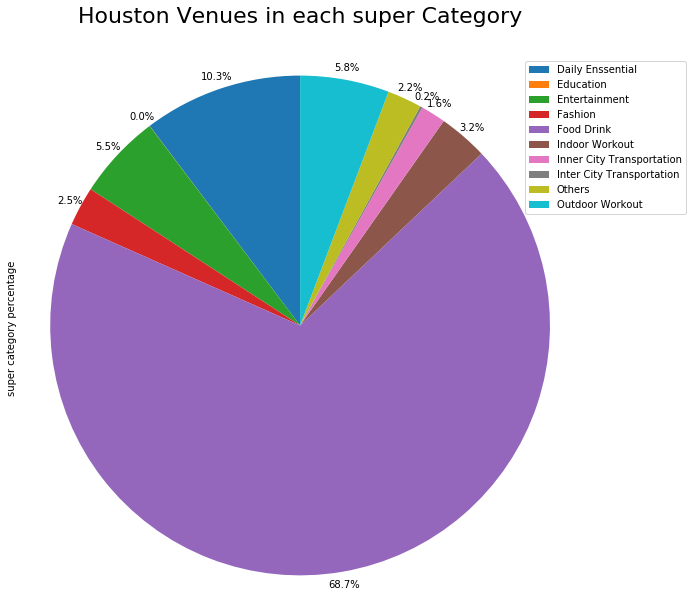

In [56]:
venues_pie.plot.pie(y = 'super category percentage',
                    autopct = '%1.1f%%',
                    pctdistance = 1.05,
                    figsize = (10,10),
                    startangle=90,labels = None, 
                    explode = explode_list)
plt.title('Houston Venues in each super Category',y = 1.05,fontsize = 22)
plt.axis('equal')
plt.legend(labels=venues_pie.index,loc = 'upper right',bbox_to_anchor = (1.2,1))
plt.show()

In [57]:
venues.head(2)

,Unnamed: 0,Neighbourhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,venue_Super_Category
0,0,Willowbrook,29.660254,-95.456096,Cue's Burgers 'n More,29.668602,-95.462011,Burger Joint,Food Drink
1,1,Willowbrook,29.660254,-95.456096,Starbucks,29.682630,-95.457831,Coffee Shop,Food Drink


In [58]:
venues.to_csv('houston_venuse0317.csv')